In [2]:
import datetime
now = datetime.datetime.now()
print ("Current date and time : ")
print (now.strftime("%Y-%m-%d %H:%M:%S"))

Current date and time : 
2022-11-07 23:39:43


In [78]:
import pandas as pd
import numpy as np

In [79]:
df = pd.read_csv('final_compiled.csv')
df.head()

/var/folders/fc/flgfd48114d1srnc_s3j4zrc0000gn/T/ipykernel_3792/3141914147.py:1: DtypeWarning: Columns (18) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('final_compiled.csv')


,id,name,artists,artist_ids,track_number,danceability,energy,key,loudness,mode,...,liveness,valence,tempo,explicit,duration_ms,date,release_date,genres,lyrics,target
0,0gplL1WMoJ6iYaPgMCL0gX,Easy On Me,['Adele'],['4dpARuHxo51G3z768sgnrY'],1,0.604,0.366,5,-7.519,1,...,0.1330,0.130,141.981,False,224695,6/11/21,NaN,"['pop soul', 'pop', 'british soul', 'uk pop']",.There ain't no gold in this river .That I've...,1
1,4BI4iNZigfF4SUq13TcFPh,INDUSTRY BABY - EXTENDED,"['Lil Nas X', 'Jack Harlow']","['7jVv8c5Fj3E9VhNjxT4snq', '2LIk90788K0zvyj2JJ...",2,0.732,0.708,10,-6.775,0,...,0.0528,0.883,149.988,True,227200,6/11/21,NaN,"['deep underground hip hop', 'lgbtq+ hip hop',...",".(D-D-Daytrip took it to ten, hey) .Baby back...",1
2,58UKC45GPNTflCN6nwCUeF,Fancy Like,['Walker Hayes'],['7sKxqpSqbIzphAKAhrqvlf'],6,0.647,0.765,1,-6.459,1,...,0.3150,0.855,79.994,False,161853,6/11/21,NaN,"['modern country rock', 'contemporary country'...",".Ayy .My girl is bangin', she's so low mainte...",1
3,3rmo8F54jFF8OgYsqTxm5d,Bad Habits,['Ed Sheeran'],['6eUKZXaKkcviH0Ku9w2n3V'],4,0.807,0.893,11,-3.745,0,...,0.3660,0.537,126.011,False,230747,6/11/21,NaN,"['pop', 'uk pop']",".(One, two, three, four) .Ooh, ooh . .Every t...",1
4,50nfwKoDiSYg8zOCREWAm5,Shivers,['Ed Sheeran'],['6eUKZXaKkcviH0Ku9w2n3V'],2,0.788,0.859,2,-2.724,1,...,0.0424,0.822,141.020,False,207853,6/11/21,NaN,"['pop', 'uk pop']",.I took an arrow to the heart .I never kissed...,1


# Pre-processing of lyrical data of compiled dataset of positive and negative sets. After cleaning, we added 3 new features of lyrics length and number of unique words in lyrics. We also included the length of song title as an additional feature

In [80]:
import re
#Text cleaning/pre-processing
def clean_lyrics(lyrics):
    lyrics = ' '.join(lyrics.split("\n"))
    lyrics_remove_symb = re.sub("[^A-Za-z0-9']+", " ", lyrics)
    lyrics_lower = lyrics_remove_symb.lower()
    lyrics_clean = re.sub("chorus", "", re.sub("verse", "", lyrics_lower))
    return lyrics_clean

df["lyrics"] = df["lyrics"].apply(lambda x: clean_lyrics(x))
#Get basic features from lyrics
df["length_lyrics"] = df["lyrics"].apply(lambda x: len(x))
df["unique_length_lyrics"] = df["lyrics"].apply(lambda x: len(set(x.split(" "))))
df["title_length"] = df["name"].apply(lambda x: len(x))
df.head()



,id,name,artists,artist_ids,track_number,danceability,energy,key,loudness,mode,...,explicit,duration_ms,date,release_date,genres,lyrics,target,length_lyrics,unique_length_lyrics,title_length
0,0gplL1WMoJ6iYaPgMCL0gX,Easy On Me,['Adele'],['4dpARuHxo51G3z768sgnrY'],1,0.604,0.366,5,-7.519,1,...,False,224695,6/11/21,NaN,"['pop soul', 'pop', 'british soul', 'uk pop']",there ain't no gold in this river that i've b...,1,937,95,10
1,4BI4iNZigfF4SUq13TcFPh,INDUSTRY BABY - EXTENDED,"['Lil Nas X', 'Jack Harlow']","['7jVv8c5Fj3E9VhNjxT4snq', '2LIk90788K0zvyj2JJ...",2,0.732,0.708,10,-6.775,0,...,True,227200,6/11/21,NaN,"['deep underground hip hop', 'lgbtq+ hip hop',...",d d daytrip took it to ten hey baby back ayy ...,1,3148,241,24
2,58UKC45GPNTflCN6nwCUeF,Fancy Like,['Walker Hayes'],['7sKxqpSqbIzphAKAhrqvlf'],6,0.647,0.765,1,-6.459,1,...,False,161853,6/11/21,NaN,"['modern country rock', 'contemporary country'...",ayy my girl is bangin' she's so low maintenan...,1,2151,144,10
3,3rmo8F54jFF8OgYsqTxm5d,Bad Habits,['Ed Sheeran'],['6eUKZXaKkcviH0Ku9w2n3V'],4,0.807,0.893,11,-3.745,0,...,False,230747,6/11/21,NaN,"['pop', 'uk pop']",one two three four ooh ooh every time you com...,1,1934,123,10
4,50nfwKoDiSYg8zOCREWAm5,Shivers,['Ed Sheeran'],['6eUKZXaKkcviH0Ku9w2n3V'],2,0.788,0.859,2,-2.724,1,...,False,207853,6/11/21,NaN,"['pop', 'uk pop']",i took an arrow to the heart i never kissed a...,1,2481,124,7


# We removed stop words and create 2 new fields which checked the length of lyrics with and the length of unique words after stopword removal

In [81]:
#Stop words removal
from nltk.corpus import stopwords 
from nltk.tokenize import word_tokenize 
stop_words = set(stopwords.words('english'))

def remove_stop_words(text):
    words = text.split(" ")
    return " ".join([i for i in words if i not in stop_words])

df["non_stop_lyrics"] = df["lyrics"].apply(lambda x: remove_stop_words(x))
df["length_lyrics_non"] = df["non_stop_lyrics"].apply(lambda x: len(x))
df["unique_length_lyrics_non"] = df["non_stop_lyrics"].apply(lambda x: len(set(x.split(" "))))
df.head()

,id,name,artists,artist_ids,track_number,danceability,energy,key,loudness,mode,...,release_date,genres,lyrics,target,length_lyrics,unique_length_lyrics,title_length,non_stop_lyrics,length_lyrics_non,unique_length_lyrics_non
0,0gplL1WMoJ6iYaPgMCL0gX,Easy On Me,['Adele'],['4dpARuHxo51G3z768sgnrY'],1,0.604,0.366,5,-7.519,1,...,NaN,"['pop soul', 'pop', 'british soul', 'uk pop']",there ain't no gold in this river that i've b...,1,937,95,10,ain't gold river i've washin' hands forever k...,522,56
1,4BI4iNZigfF4SUq13TcFPh,INDUSTRY BABY - EXTENDED,"['Lil Nas X', 'Jack Harlow']","['7jVv8c5Fj3E9VhNjxT4snq', '2LIk90788K0zvyj2JJ...",2,0.732,0.708,10,-6.775,0,...,NaN,"['deep underground hip hop', 'lgbtq+ hip hop',...",d d daytrip took it to ten hey baby back ayy ...,1,3148,241,24,daytrip took ten hey baby back ayy couple rac...,2119,186
2,58UKC45GPNTflCN6nwCUeF,Fancy Like,['Walker Hayes'],['7sKxqpSqbIzphAKAhrqvlf'],6,0.647,0.765,1,-6.459,1,...,NaN,"['modern country rock', 'contemporary country'...",ayy my girl is bangin' she's so low maintenan...,1,2151,144,10,ayy girl bangin' low maintenance need champag...,1518,107
3,3rmo8F54jFF8OgYsqTxm5d,Bad Habits,['Ed Sheeran'],['6eUKZXaKkcviH0Ku9w2n3V'],4,0.807,0.893,11,-3.745,0,...,NaN,"['pop', 'uk pop']",one two three four ooh ooh every time you com...,1,1934,123,10,one two three four ooh ooh every time come ar...,1353,86
4,50nfwKoDiSYg8zOCREWAm5,Shivers,['Ed Sheeran'],['6eUKZXaKkcviH0Ku9w2n3V'],2,0.788,0.859,2,-2.724,1,...,NaN,"['pop', 'uk pop']",i took an arrow to the heart i never kissed a...,1,2481,124,7,took arrow heart never kissed mouth tastes li...,1513,90


# Next, we want to check the most popular words used in lyrics for hit songs (target == 1), therefore we use word cloud for display

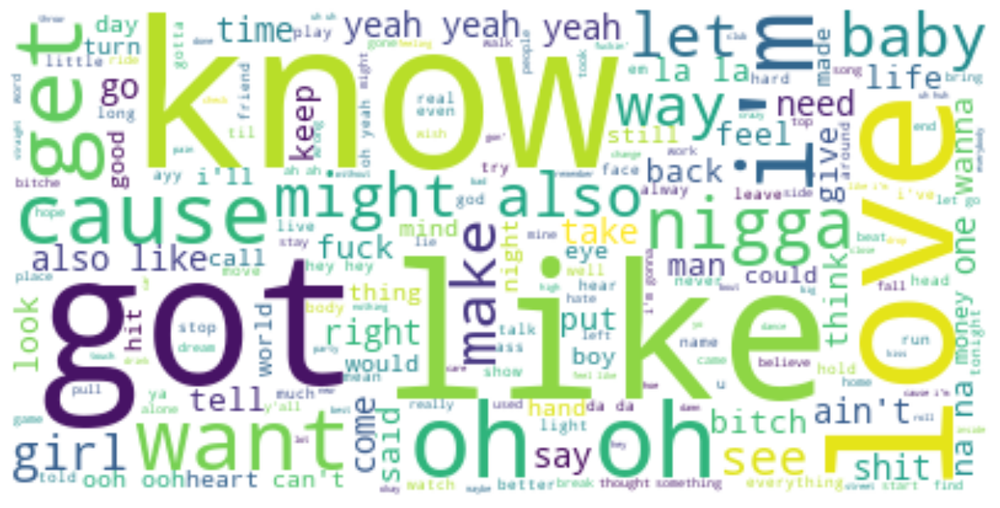

In [82]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
hit_words = df[df["target"] == 1]["lyrics"].values
stopwords_set = set(stop_words)
str_val = ' '.join(hit_words)
wordcloud = WordCloud(stopwords=stopwords_set, background_color='white').generate(str_val)
plt.figure(figsize=(15,8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

# We notice that hit songs use very common words, we then check the word cloud after stop word removal to see if most popular words have changed.

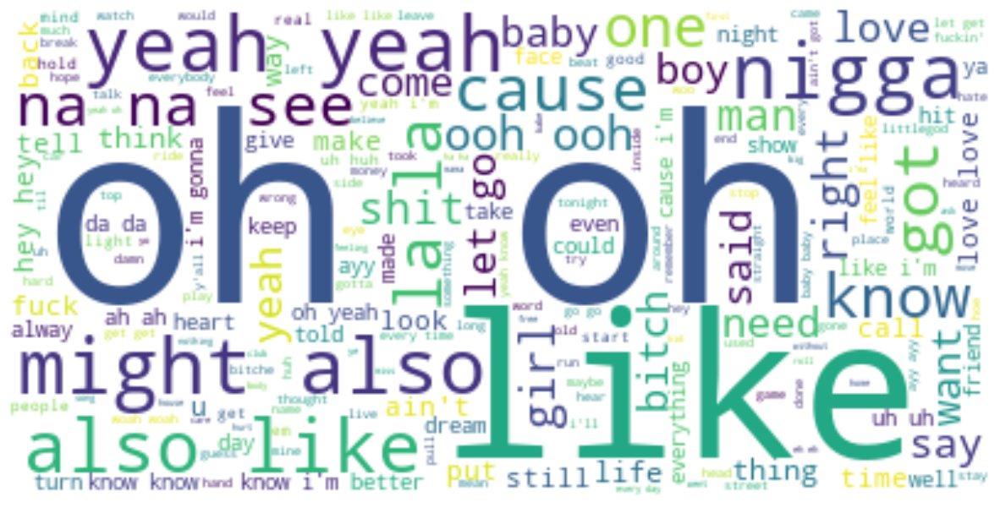

In [83]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
#Plot to show non-stop words for hit songs
hit_words_v2 = df[df["target"] == 1]["non_stop_lyrics"].values
stopwords_set = set(stop_words)
str_val_v2 = ' '.join(hit_words_v2)
wordcloud = WordCloud(stopwords=stopwords_set, background_color='white').generate(str_val_v2)
plt.figure(figsize=(15,8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

# We repeat the same steps for non-hit songs

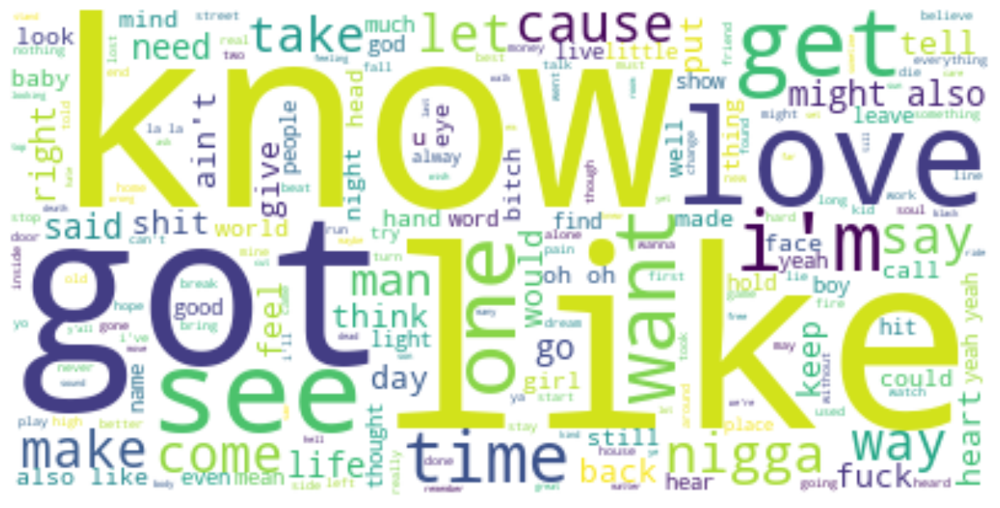

In [84]:
#Plot to show non-stop words for non-hit songs
non_hit_words = df[df["target"] == 0]["lyrics"].values
stopwords_set = set(stop_words)
str_val_non_hit = ' '.join(non_hit_words)
wordcloud = WordCloud(stopwords=stopwords_set, background_color='white').generate(str_val_non_hit)
plt.figure(figsize=(15,8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

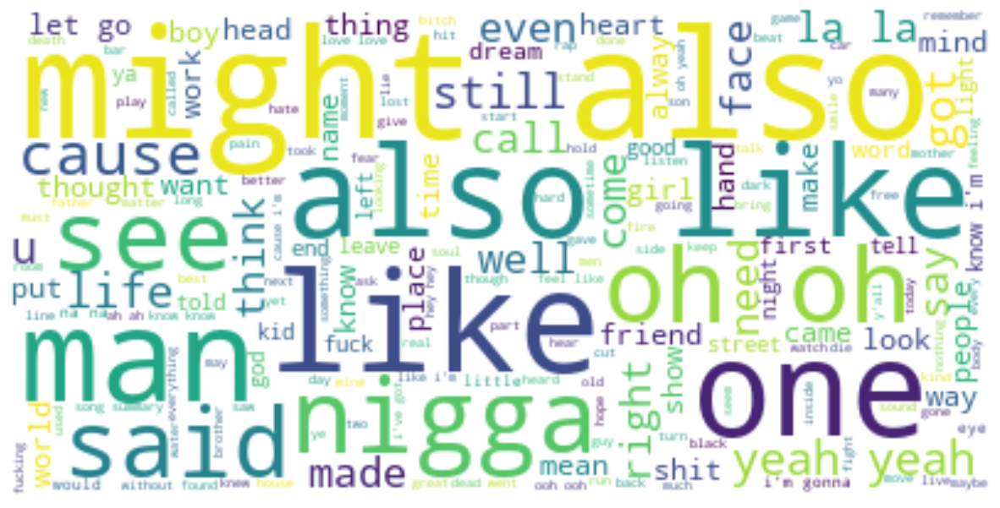

In [85]:
#Plot to show non-stop words for non-hit songs
non_hit_words_v2 = df[df["target"] == 0]["non_stop_lyrics"].values
stopwords_set = set(stop_words)
str_val_non_v2 = ' '.join(non_hit_words_v2)
wordcloud = WordCloud(stopwords=stopwords_set, background_color='white').generate(str_val_non_v2)
plt.figure(figsize=(15,8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

# To enhance our features, we included sentimer scores using vader sentiments

In [86]:
#Generate sentiment scores for lyrics
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()

df["sentiment"] = df['non_stop_lyrics'].apply(lambda x: analyzer.polarity_scores(x))

In [87]:
df = df[list(df.columns)[:34]]

In [88]:
df["sentiment"][0]

{'neg': 0.02, 'neu': 0.654, 'pos': 0.326, 'compound': 0.9842}

In [89]:
#Extract sentiment scores
df['positive'] = df['sentiment'].apply(lambda x: x['pos'])
df['neutral'] = df['sentiment'].apply(lambda x: x['neu'])
df['negative'] = df['sentiment'].apply(lambda x: x['neg'])
df['compound'] = df['sentiment'].apply(lambda x: x['compound'])

# Flatten list of genres in each row and turn them into one hot vector, as we have 2700+ sub-genres, we will only consider top 20 genres in the one-hot representation

In [125]:
from ast import literal_eval
#Fix genres
dict_counter = {}
def flatten_genres(genre_lst):
    return [i for i in literal_eval(genre_lst) if i in genres]

def count_most_popular(text, dict_counter):
    for genre in literal_eval(text):
        if genre not in dict_counter:
            dict_counter[genre] = 0
        dict_counter[genre] += 1

df["genres"].apply(lambda x: count_most_popular(x, dict_counter))
genres = set(i[0] for i in sorted(dict_counter.items(), key=lambda x: x[1], reverse=True)[:20])
df["genres"] = df["genres"].apply(lambda x: flatten_genres(x))
df

,id,name,artists,artist_ids,track_number,danceability,energy,key,loudness,mode,...,unique_length_lyrics,title_length,non_stop_lyrics,length_lyrics_non,unique_length_lyrics_non,sentiment,positive,neutral,negative,compound
0,0gplL1WMoJ6iYaPgMCL0gX,Easy On Me,['Adele'],['4dpARuHxo51G3z768sgnrY'],1,0.604,0.366,5,-7.519,1,...,95,10,ain't gold river i've washin' hands forever k...,522,56,"{'neg': 0.02, 'neu': 0.654, 'pos': 0.326, 'com...",0.326,0.654,0.020,0.9842
1,4BI4iNZigfF4SUq13TcFPh,INDUSTRY BABY - EXTENDED,"['Lil Nas X', 'Jack Harlow']","['7jVv8c5Fj3E9VhNjxT4snq', '2LIk90788K0zvyj2JJ...",2,0.732,0.708,10,-6.775,0,...,241,24,daytrip took ten hey baby back ayy couple rac...,2119,186,"{'neg': 0.065, 'neu': 0.674, 'pos': 0.261, 'co...",0.261,0.674,0.065,0.9971
2,58UKC45GPNTflCN6nwCUeF,Fancy Like,['Walker Hayes'],['7sKxqpSqbIzphAKAhrqvlf'],6,0.647,0.765,1,-6.459,1,...,144,10,ayy girl bangin' low maintenance need champag...,1518,107,"{'neg': 0.029, 'neu': 0.683, 'pos': 0.288, 'co...",0.288,0.683,0.029,0.9972
3,3rmo8F54jFF8OgYsqTxm5d,Bad Habits,['Ed Sheeran'],['6eUKZXaKkcviH0Ku9w2n3V'],4,0.807,0.893,11,-3.745,0,...,123,10,one two three four ooh ooh every time come ar...,1353,86,"{'neg': 0.244, 'neu': 0.617, 'pos': 0.139, 'co...",0.139,0.617,0.244,-0.9856
4,50nfwKoDiSYg8zOCREWAm5,Shivers,['Ed Sheeran'],['6eUKZXaKkcviH0Ku9w2n3V'],2,0.788,0.859,2,-2.724,1,...,124,7,took arrow heart never kissed mouth tastes li...,1513,90,"{'neg': 0.06, 'neu': 0.643, 'pos': 0.297, 'com...",0.297,0.643,0.060,0.9973
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57371,4lCAS06lKCJiFVGhHqxCtW,Talk About It,['A Boogie Wit da Hoodie'],['31W5EY0aAly4Qieq6OFu6I'],9,0.445,0.584,1,-9.666,0,...,255,13,back around money good back around mmm x get ...,1790,190,"{'neg': 0.202, 'neu': 0.555, 'pos': 0.244, 'co...",0.244,0.555,0.202,0.9040
57372,60xDmDoYJytWs5do9aHI0F,Beat the Odds,['Money Man'],['3Rx4PJ7SP6unkOk5elPUK7'],8,0.787,0.590,10,-7.123,0,...,250,13,keez track ooh fuck stats beatin' odds hittin...,2096,200,"{'neg': 0.259, 'neu': 0.544, 'pos': 0.196, 'co...",0.196,0.544,0.259,-0.9934
57373,6bAHtwPD7MBjSD8UmZFsh8,Geography,"['Chaos Chaos', 'Kevin Hickey', 'Lucas McCross...","['6D6rjLdxyE5vwhMlkuQq0E', '12Cqmjoj96GR0wFIup...",1,0.522,0.788,10,-5.926,1,...,38,9,geography draw line across sand know blow away...,298,22,"{'neg': 0.117, 'neu': 0.787, 'pos': 0.096, 'co...",0.096,0.787,0.117,-0.2732
57374,0G9CL2p0TP4kTIXroDR326,twin hearts (feat. YURMS),"['ITSOKTOCRY', 'Yurms']","['2BUUAEl4BwFRA9NBDgMWSf', '2IaEQEZ606L3nZuGnm...",6,0.786,0.609,11,-6.139,1,...,152,25,could go wrong find older think cold i'm cold...,934,105,"{'neg': 0.214, 'neu': 0.537, 'pos': 0.25, 'com...",0.250,0.537,0.214,0.3420


In [126]:
#One hot encoding of genres
from sklearn.preprocessing import MultiLabelBinarizer
from ast import literal_eval

mlb = MultiLabelBinarizer(sparse_output=True)
df_v2 = df.copy()
df_v2 = df_v2.join(
            pd.DataFrame.sparse.from_spmatrix(
                mlb.fit_transform(df_v2.pop('genres')),
                index=df.index,
                columns=mlb.classes_))

In [127]:
df_v2

,id,name,artists,artist_ids,track_number,danceability,energy,key,loudness,mode,...,pop rap,pop rock,post-teen pop,r&b,rap,rock,soft rock,southern hip hop,trap,urban contemporary
0,0gplL1WMoJ6iYaPgMCL0gX,Easy On Me,['Adele'],['4dpARuHxo51G3z768sgnrY'],1,0.604,0.366,5,-7.519,1,...,0,0,0,0,0,0,0,0,0,0
1,4BI4iNZigfF4SUq13TcFPh,INDUSTRY BABY - EXTENDED,"['Lil Nas X', 'Jack Harlow']","['7jVv8c5Fj3E9VhNjxT4snq', '2LIk90788K0zvyj2JJ...",2,0.732,0.708,10,-6.775,0,...,1,0,0,0,1,0,0,0,0,0
2,58UKC45GPNTflCN6nwCUeF,Fancy Like,['Walker Hayes'],['7sKxqpSqbIzphAKAhrqvlf'],6,0.647,0.765,1,-6.459,1,...,0,0,0,0,0,0,0,0,0,0
3,3rmo8F54jFF8OgYsqTxm5d,Bad Habits,['Ed Sheeran'],['6eUKZXaKkcviH0Ku9w2n3V'],4,0.807,0.893,11,-3.745,0,...,0,0,0,0,0,0,0,0,0,0
4,50nfwKoDiSYg8zOCREWAm5,Shivers,['Ed Sheeran'],['6eUKZXaKkcviH0Ku9w2n3V'],2,0.788,0.859,2,-2.724,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57371,4lCAS06lKCJiFVGhHqxCtW,Talk About It,['A Boogie Wit da Hoodie'],['31W5EY0aAly4Qieq6OFu6I'],9,0.445,0.584,1,-9.666,0,...,1,0,0,0,1,0,0,0,1,0
57372,60xDmDoYJytWs5do9aHI0F,Beat the Odds,['Money Man'],['3Rx4PJ7SP6unkOk5elPUK7'],8,0.787,0.590,10,-7.123,0,...,0,0,0,0,1,0,0,1,1,0
57373,6bAHtwPD7MBjSD8UmZFsh8,Geography,"['Chaos Chaos', 'Kevin Hickey', 'Lucas McCross...","['6D6rjLdxyE5vwhMlkuQq0E', '12Cqmjoj96GR0wFIup...",1,0.522,0.788,10,-5.926,1,...,0,0,0,0,0,0,0,0,0,0
57374,0G9CL2p0TP4kTIXroDR326,twin hearts (feat. YURMS),"['ITSOKTOCRY', 'Yurms']","['2BUUAEl4BwFRA9NBDgMWSf', '2IaEQEZ606L3nZuGnm...",6,0.786,0.609,11,-6.139,1,...,0,0,0,0,0,0,0,0,0,0


In [58]:
print(df_v2[df_v2["target"] == 1]["positive"].describe())
print(df_v2[df_v2["target"] == 0]["positive"].describe())

count    8610.000000
mean        0.228867
std         0.116359
min         0.000000
25%         0.147000
50%         0.211000
75%         0.294000
max         0.973000
Name: positive, dtype: float64
count    48766.000000
mean         0.205982
std          0.128791
min          0.000000
25%          0.121000
50%          0.185000
75%          0.271000
max          1.000000
Name: positive, dtype: float64


<AxesSubplot:ylabel='Frequency'>

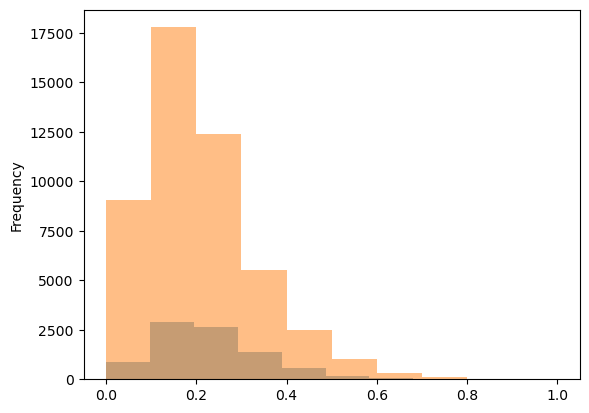

In [59]:
df_v2[df_v2["target"] == 1]["positive"].plot.hist(alpha=0.5)
df_v2[df_v2["target"] == 0]["positive"].plot.hist(alpha=0.5)

In [60]:
print(df_v2[df_v2["target"] == 1]["negative"].describe())
print(df_v2[df_v2["target"] == 0]["negative"].describe())

count    8610.000000
mean        0.134513
std         0.096229
min         0.000000
25%         0.061000
50%         0.116000
75%         0.189000
max         0.786000
Name: negative, dtype: float64
count    48766.000000
mean         0.142584
std          0.109725
min          0.000000
25%          0.060000
50%          0.126000
75%          0.203000
max          1.000000
Name: negative, dtype: float64


<AxesSubplot:ylabel='Frequency'>

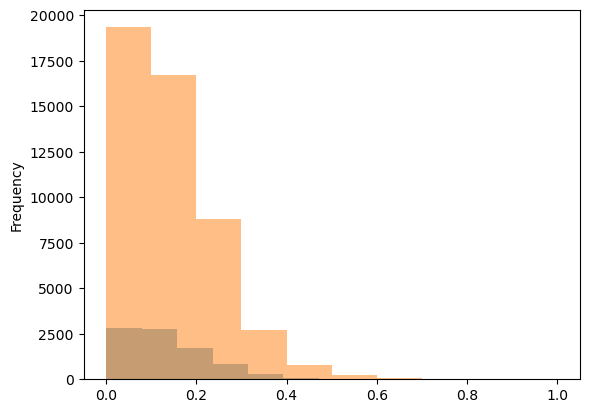

In [61]:
df_v2[df_v2["target"] == 1]["negative"].plot.hist(alpha=0.5)
df_v2[df_v2["target"] == 0]["negative"].plot.hist(alpha=0.5)

In [62]:
print(df_v2[df_v2["target"] == 1]["neutral"].describe())
print(df_v2[df_v2["target"] == 0]["neutral"].describe())

count    8610.000000
mean        0.636620
std         0.129361
min         0.027000
25%         0.555000
50%         0.636000
75%         0.718000
max         1.000000
Name: neutral, dtype: float64
count    48766.000000
mean         0.649629
std          0.151731
min          0.000000
25%          0.557000
50%          0.646000
75%          0.737000
max          1.000000
Name: neutral, dtype: float64


<AxesSubplot:ylabel='Frequency'>

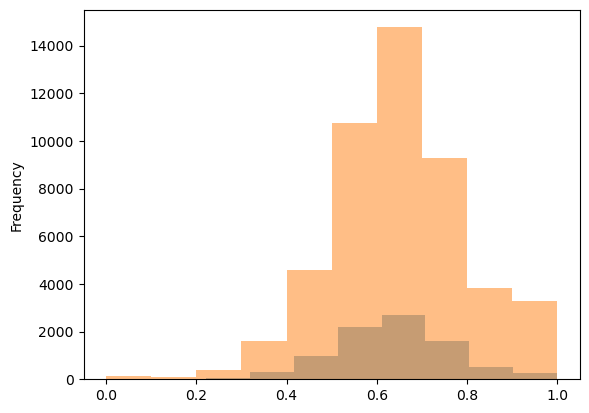

In [63]:
df_v2[df_v2["target"] == 1]["neutral"].plot.hist(alpha=0.5)
df_v2[df_v2["target"] == 0]["neutral"].plot.hist(alpha=0.5)

In [64]:
print(df_v2[df_v2["target"] == 1]["compound"].describe())
print(df_v2[df_v2["target"] == 0]["compound"].describe())

count    8610.000000
mean        0.411031
std         0.827734
min        -1.000000
25%        -0.620350
50%         0.958050
75%         0.992800
max         1.000000
Name: compound, dtype: float64
count    48766.000000
mean         0.244655
std          0.831842
min         -1.000000
25%         -0.807400
50%          0.765150
75%          0.979000
max          1.000000
Name: compound, dtype: float64


<AxesSubplot:ylabel='Frequency'>

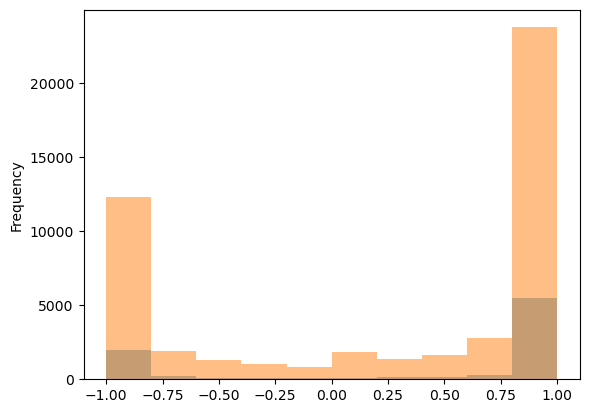

In [65]:
df_v2[df_v2["target"] == 1]["compound"].plot.hist(alpha=0.5)
df_v2[df_v2["target"] == 0]["compound"].plot.hist(alpha=0.5)

# Here we plan to merge to datasets as positive songs with release date includes additional information to supplement our existing data

In [128]:
#Update release date of pop songs
df_pos_song_release = pd.read_csv("pos_songs_with_rel_date.csv")
df_pos_song_release

,id,name,artists,artist_ids,track_number,danceability,energy,key,loudness,mode,...,liveness,valence,tempo,explicit,duration_ms,date,release_date,genres,lyrics,target
0,0gplL1WMoJ6iYaPgMCL0gX,Easy On Me,Adele,['4dpARuHxo51G3z768sgnrY'],1,0.604,0.366,5,-7.519,1,...,0.1330,0.130,141.981,False,224695,6/11/21,14/10/2021,"['pop soul', 'pop', 'british soul', 'uk pop']",.There ain't no gold in this river .That I've...,1
1,4BI4iNZigfF4SUq13TcFPh,INDUSTRY BABY - EXTENDED,"Lil Nas X, Jack Harlow","['7jVv8c5Fj3E9VhNjxT4snq', '2LIk90788K0zvyj2JJ...",2,0.732,0.708,10,-6.775,0,...,0.0528,0.883,149.988,True,227200,6/11/21,09/10/2021,"['deep underground hip hop', 'lgbtq+ hip hop',...",".(D-D-Daytrip took it to ten, hey) .Baby back...",1
2,58UKC45GPNTflCN6nwCUeF,Fancy Like,Walker Hayes,['7sKxqpSqbIzphAKAhrqvlf'],6,0.647,0.765,1,-6.459,1,...,0.3150,0.855,79.994,False,161853,6/11/21,21/01/2022,"['modern country rock', 'contemporary country'...",".Ayy .My girl is bangin', she's so low mainte...",1
3,3rmo8F54jFF8OgYsqTxm5d,Bad Habits,Ed Sheeran,['6eUKZXaKkcviH0Ku9w2n3V'],4,0.807,0.893,11,-3.745,0,...,0.3660,0.537,126.011,False,230747,6/11/21,29/10/2021,"['pop', 'uk pop']",".(One, two, three, four) .Ooh, ooh . .Every t...",1
4,50nfwKoDiSYg8zOCREWAm5,Shivers,Ed Sheeran,['6eUKZXaKkcviH0Ku9w2n3V'],2,0.788,0.859,2,-2.724,1,...,0.0424,0.822,141.020,False,207853,6/11/21,29/10/2021,"['pop', 'uk pop']",.I took an arrow to the heart .I never kissed...,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8605,7iXF2W9vKmDoGAhlHdpyIa,Forgot About Dre,"Dr. Dre, Eminem","['6DPYiyq5kWVQS4RGwxzPC7', '7dGJo4pcD2V6oG8kP0...",10,0.924,0.740,8,-1.299,1,...,0.1630,0.621,133.974,True,222293,3/6/00,16/11/1999,"['west coast rap', 'g funk', 'detroit hip hop'...","Y'all know me, still the same O.G.But I been l...",1
8606,2m1hi0nfMR9vdGC8UcrnwU,All The Small Things,blink-182,['6FBDaR13swtiWwGhX1WQsP'],8,0.434,0.897,0,-4.918,1,...,0.6120,0.684,148.726,False,167067,6/5/00,01/06/1999,"['pop punk', 'punk', 'socal pop punk']","All the small things.True care, truth brings.I...",1
8607,3a1zG1WBUNifXQjBKzsgSm,Real Live Woman,Trisha Yearwood,['3XlIhgydjvC4EniPFZT20j'],8,0.626,0.410,10,-8.551,1,...,0.1450,0.346,126.517,False,234400,6/5/00,01/01/2000,"['contemporary country', 'country dawn', 'coun...",I don't buy the lines in magazines.That tell m...,1
8608,4rZB2G955dQMcjlb7e3VNB,24-Jul,Kevon Edmonds,['3an8oUQQJYhvsqS59GQrqR'],3,0.696,0.627,4,-5.629,1,...,0.0993,0.322,116.047,False,274267,18/3/00,12/10/1999,"['new jack swing', 'urban contemporary', 'r&b']",Baby it's no mystery.You're bringing out the b...,1


In [129]:
release_date_pos = df_pos_song_release.set_index('id')["release_date"]
release_date_pos

id
0gplL1WMoJ6iYaPgMCL0gX    14/10/2021
4BI4iNZigfF4SUq13TcFPh    09/10/2021
58UKC45GPNTflCN6nwCUeF    21/01/2022
3rmo8F54jFF8OgYsqTxm5d    29/10/2021
50nfwKoDiSYg8zOCREWAm5    29/10/2021
                             ...    
7iXF2W9vKmDoGAhlHdpyIa    16/11/1999
2m1hi0nfMR9vdGC8UcrnwU    01/06/1999
3a1zG1WBUNifXQjBKzsgSm    01/01/2000
4rZB2G955dQMcjlb7e3VNB    12/10/1999
3Th5HBAlRZF0oN31ubxHA9    01/01/1999
Name: release_date, Length: 8610, dtype: object

In [130]:
df_combined = df_v2.merge(release_date_pos, on='id', how='right')
df_combined["release_date"] = df_combined["release_date_y"]
df_combined = df_combined.drop(columns=['release_date_y'])
df_combined = df_combined.set_index('id')

In [131]:
df_combined = pd.concat([df_combined, df_v2[df_v2["target"] == 0].set_index('id')])
df_combined = df_combined.reset_index().drop_duplicates(subset='id')
df_combined

,id,name,artists,artist_ids,track_number,danceability,energy,key,loudness,mode,...,pop rock,post-teen pop,r&b,rap,rock,soft rock,southern hip hop,trap,urban contemporary,release_date
0,0gplL1WMoJ6iYaPgMCL0gX,Easy On Me,['Adele'],['4dpARuHxo51G3z768sgnrY'],1,0.604,0.366,5,-7.519,1,...,0,0,0,0,0,0,0,0,0,14/10/2021
1,4BI4iNZigfF4SUq13TcFPh,INDUSTRY BABY - EXTENDED,"['Lil Nas X', 'Jack Harlow']","['7jVv8c5Fj3E9VhNjxT4snq', '2LIk90788K0zvyj2JJ...",2,0.732,0.708,10,-6.775,0,...,0,0,0,1,0,0,0,0,0,09/10/2021
2,58UKC45GPNTflCN6nwCUeF,Fancy Like,['Walker Hayes'],['7sKxqpSqbIzphAKAhrqvlf'],6,0.647,0.765,1,-6.459,1,...,0,0,0,0,0,0,0,0,0,21/01/2022
3,3rmo8F54jFF8OgYsqTxm5d,Bad Habits,['Ed Sheeran'],['6eUKZXaKkcviH0Ku9w2n3V'],4,0.807,0.893,11,-3.745,0,...,0,0,0,0,0,0,0,0,0,29/10/2021
4,50nfwKoDiSYg8zOCREWAm5,Shivers,['Ed Sheeran'],['6eUKZXaKkcviH0Ku9w2n3V'],2,0.788,0.859,2,-2.724,1,...,0,0,0,0,0,0,0,0,0,29/10/2021
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57495,4lCAS06lKCJiFVGhHqxCtW,Talk About It,['A Boogie Wit da Hoodie'],['31W5EY0aAly4Qieq6OFu6I'],9,0.445,0.584,1,-9.666,0,...,0,0,0,1,0,0,0,1,0,18/6/20
57496,60xDmDoYJytWs5do9aHI0F,Beat the Odds,['Money Man'],['3Rx4PJ7SP6unkOk5elPUK7'],8,0.787,0.590,10,-7.123,0,...,0,0,0,1,0,0,1,1,0,20/3/20
57497,6bAHtwPD7MBjSD8UmZFsh8,Geography,"['Chaos Chaos', 'Kevin Hickey', 'Lucas McCross...","['6D6rjLdxyE5vwhMlkuQq0E', '12Cqmjoj96GR0wFIup...",1,0.522,0.788,10,-5.926,1,...,0,0,0,0,0,0,0,0,0,21/2/20
57498,0G9CL2p0TP4kTIXroDR326,twin hearts (feat. YURMS),"['ITSOKTOCRY', 'Yurms']","['2BUUAEl4BwFRA9NBDgMWSf', '2IaEQEZ606L3nZuGnm...",6,0.786,0.609,11,-6.139,1,...,0,0,0,0,0,0,0,0,0,6/11/20


In [132]:
#Format release_date
def format_release_date(date):
    lst = date.split("/")
    for i in range(len(lst)):
        if i == 0:
            if len(lst[i]) == 1:
                lst[i] = "0"+lst[i]
        elif i == 1:
            if len(lst[i]) == 1:
                lst[i] = "0"+lst[i]            
        elif i == 2:
            if len(lst[i]) == 2:
                lst[i] = "20" + lst[i]
    return "-".join(lst[::-1])
df_combined["release_date"] = df_combined["release_date"].apply(lambda x: format_release_date(x))

# Lastly to determine how artist past success affects whether song is hit, we try to determine a 

In [134]:
df_charts = pd.read_csv('../raw-data/charts.csv')
df_charts

,date,rank,song,artist,last-week,peak-rank,weeks-on-board
0,6/11/21,1,Easy On Me,Adele,1.0,1,3
1,6/11/21,2,Stay,The Kid LAROI & Justin Bieber,2.0,1,16
2,6/11/21,3,Industry Baby,Lil Nas X & Jack Harlow,3.0,1,14
3,6/11/21,4,Fancy Like,Walker Hayes,4.0,3,19
4,6/11/21,5,Bad Habits,Ed Sheeran,5.0,2,18
...,...,...,...,...,...,...,...
330082,4/8/58,96,Over And Over,Thurston Harris,NaN,96,1
330083,4/8/58,97,I Believe In You,Robert & Johnny,NaN,97,1
330084,4/8/58,98,Little Serenade,The Ames Brothers,NaN,98,1
330085,4/8/58,99,I'll Get By (As Long As I Have You),Billy Williams,NaN,99,1


# Clean up formatting in year

In [136]:
def get_year(date):
    return int(date.split("/")[-1])

df_charts["year"] = df_charts["date"].apply(lambda x: get_year(x))
df_charts["date"] = df_charts["date"].apply(lambda x: format_release_date(x))

In [137]:
df_charts = df_charts[df_charts["year"] <= 21]
df_charts

,date,rank,song,artist,last-week,peak-rank,weeks-on-board,year
0,2021-11-06,1,Easy On Me,Adele,1.0,1,3,21
1,2021-11-06,2,Stay,The Kid LAROI & Justin Bieber,2.0,1,16,21
2,2021-11-06,3,Industry Baby,Lil Nas X & Jack Harlow,3.0,1,14,21
3,2021-11-06,4,Fancy Like,Walker Hayes,4.0,3,19,21
4,2021-11-06,5,Bad Habits,Ed Sheeran,5.0,2,18,21
...,...,...,...,...,...,...,...,...
114095,2000-01-01,96,L.A. Song,Beth Hart,99.0,96,6,0
114096,2000-01-01,97,Gotta Man,Eve,66.0,26,16,0
114097,2000-01-01,98,The Quittin' Kind,Joe Diffie,NaN,98,1,0
114098,2000-01-01,99,Steam,Ty Herndon,91.0,83,12,0


In [138]:
dic = {}
for idx in df_combined.index:
    print((df_combined.loc[idx, "name"].split(" - ")[0]).lower())
    dic[(df_combined.loc[idx, "name"].split(" - ")[0]).lower()] = df_combined.loc[idx, "artist_ids"].lower()

easy on me
industry baby
fancy like
bad habits
shivers
good 4 u
need to know
essence
heat waves
beggin'
you right
save your tears
if i didn't love you
traitor
my universe
who want smoke?
meet me at our spot
montero (call me by your name)
let's go brandon club mix
pepas
love nwantiti (ah ah ah)
take my breath
wockesha
better days
buy dirt
ghost
lets go brandon
cold as you
a-o-k
you should probably leave
leave the door open
memory i don't mess with
gyalis
i was on a boat that day
have mercy
same boat
my boy
hurricane
baddest
knowing you
memory
cold beer calling my name
beat the odds
pissed me off
woman
sand in my boots
'til you can't
love again
whiskey and rain
one mississippi
jugaste y sufrí
too easy
está dañada
vuelve
tequila little time
whole lotta money
2055
wfm
poke it out
praise god
lo siento
freedom was a highway
for tonight
thot shit
like a lady
get into it (yuh)
scorpio
big energy
half of my hometown (feat. kenny chesney)
money
no friends in the industry
ya supérame (en vivo)
wh

just because
how fast can you love
boom
in the still of the night
don't play games
what goes around
slave master
broken days
old school style
troublesome kind
ready to take a chance again
something freaky
where da south at?
2 good 2 be true
blue hotel
missin' u
we are children of the world
i could wait
all over the world (la-la)
triple x
warm country sun
let me
the penny song
the fall
i love you
beat city
the patient mental
cross walk
my kind of girl
blvd.
angels in the snow
my first ride
plan a
dramacyde (feat. big pun & kool g rap)
dance with you
too close
make over
come to mama
the gift (feat. collin raye & susan ashton)
send in the clowns
unbreakable
diamenz
this old flame
time
family tree
when the shit hitz the fan
ragged old truck
cool love
please tell me why
funky junky
the cheatin' hotel
ultimate
in the face of love
things you say
twas the night
song for an old friend
neediness
somebody special
comfort me
2 good 2 b true
have yourself a merry little christmas
it ain't me, babe 

babies
everybody wants you
how shall i to heaven aspire?
blah blah blah
how many words
sons
missing
an admission
land of a thousand dances
to go home
wherever i am
downtown mayors goodnight, alley kids rule!
movin' higher
curious
time
min värld
multiple stab wounds
every girl
stone wall, stone fence
l'ombre de toi
live these raps
my eyes adored you
love and affection
in-between
yankee go home
hot knives
hotter than hell
do what the spirit say do
uh huh
house of cards
time will pass you by
face of the earth
dirty pictures
in the mix
get low
always love
on darkened wings
three's company theme
make u fly
instant karma
break yer bass drone again
pain and betrayal
there go i
the man in the hat
you make love so good
last to know
autosleeper
metal airplanes
marking time
please come home for christmas
waterbaby
where i land
down low
turn you down
snow and joy
until there was you
we sip hennessy
the youth
comin' home
gotta be this or that
rose's blue
s.c.u.m.
will gravity win tonight?
diablo
yo

up on the lowdown
mason jar
sunset
live golden
kapuskasing coffee
sour (feat. jadakiss, rocko)
the posse
moment of silence
broken people
hard times
for my enemy
like me
whispers in the mist
walk this way (feat. aerosmith)
con todas las ganas
inside the vortex
world tour (feat. vado)
get up
you are lost
unveiled
the way (kilo)
13 (under a bad sign)
give me the simple life
i'm yours
introduction
now and then
i'll be around
help the brovas (feat. amar divine & spliff star)
beauty of the unhidden heart (feat. sister crayon)
i don't need nobody else
my freedom
winners
what we become
every woman in the world
rage flows
children of the world united
battle cry
see you someday
as flittermice as satans spys
goodnight shirley
re:i am
blacksphere
urutora kaiju (feat. tonedeff)
helena
quantum
a dangerous thing
boom
gasp/the reflex
untouched and arrived
i attack the darkness
don't think about it too long
there's no getting away from you
open the door
hands up if you wanna be loved
grand morbid funer

watch out
gata
january leaves
fresh
telephone
ornament
doubledecker
heartbeat
type mean
murda talk
[stef]
little girl blue
great bambino
ecstasy
fill the crown
habit
bit of rain
wild
purpose
high rise
heat wave
bank love based freestyle
just a phase
strawberry!
it's now safe to turn off your computer
lapdance
metal wings
southside
don't give up
showing you
salt
chiefin'
apparent absence
still your best
life of whodeywant
cerulean
little red lines
vegas on my mind
so when you gonna...
rodeo station
strawberry water
the people's champ outro
t.y.p.g.
bright morning stars
the name (feat. koryn hawthorne)
alarm clock
say she love me
all systems go
rockstar lifestyle
evil always wins
(chatter)
move around
drifting apart
life's a message
dirty like the city
liten
revelations
harlem shake (feat. young thug)
warum ich dich nicht vermiss
get richer
in unison
i'm on some
drought where
funerals
ooh la la
i hate everything (feat. action bronson)
i wanna shoot my friends
eye of the tiger
beneath the

In [139]:
def get_song(dic, x):
    if x.lower() not in dic:
        return []
    else:
        return dic[x.lower()]
df_charts["artist_ids"] = df_charts["song"].apply(lambda x: get_song(dic, x))

/var/folders/fc/flgfd48114d1srnc_s3j4zrc0000gn/T/ipykernel_3792/1190091294.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_charts["artist_ids"] = df_charts["song"].apply(lambda x: get_song(dic, x))


In [ ]:
#Create ranking system
df_charts["month"] = df_charts["date"].apply(lambda x: x[:7])


# Create dictionary which stores the artist average ranking for the given month to smooth out data, because weekly billboard charts have repeated values

In [141]:
artist_map = {}
from ast import literal_eval
for idx in df_charts.index:
    if len(df_charts.loc[idx, "artist_ids"]) > 2:
        art_lst = literal_eval(df_charts.loc[idx, "artist_ids"])
        month = df_charts.loc[idx, "month"]
        rank = df_charts.loc[idx, "rank"]
        for art in art_lst:
            if art not in artist_map:
                artist_map[art] = {month: []}
            elif month not in artist_map[art]:
                artist_map[art][month] = []
            artist_map[art][month].append(int(rank))
artist_map

{'4dparuhxo51g3z768sgnry': {'2021-11': [1],
  '2021-10': [1, 68],
  '2017-04': [47, 46, 53, 43],
  '2017-03': [43, 41, 37, 31],
  '2017-02': [30, 28, 26, 34],
  '2017-01': [33, 38, 44, 51],
  '2016-12': [61, 58, 78, 80, 39, 94],
  '2016-11': [33, 31, 26, 24],
  '2016-10': [19, 17, 16, 13, 10],
  '2016-09': [8, 11, 9, 10],
  '2016-08': [11, 10, 9, 10],
  '2016-07': [10, 12, 13, 19, 20],
  '2016-06': [28, 32, 26],
  '2016-03': [77],
  '2015-12': [70, 79],
  '2012-06': [38, 33, 30, 26, 21],
  '2012-05': [16, 16, 16, 16],
  '2012-04': [20, 23, 35, 44],
  '2012-03': [50, 57, 39, 51, 67],
  '2012-01': [95, 75, 78],
  '2011-12': [87, 82, 60],
  '2011-08': [99, 99, 96],
  '2011-05': [96, 85, 63, 66],
  '2009-03': [72],
  '2009-02': [21, 64],
  '2009-01': [94],
  '2008-12': [96, 100],
  '2008-11': [82]},
 '7gvvtb8yfv0zrdi30qce6t': {'2021-11': [2],
  '2021-10': [2, 2, 1, 2, 1],
  '2021-09': [1, 6, 2, 1],
  '2021-08': [1, 1, 1, 4],
  '2021-07': [4, 3],
  '2020-12': [22],
  '2018-06': [88],
  '201

In [142]:
#Aggregate artist ranking
for key, value in artist_map.items():
    dic2 = value
    for key2, value2 in dic2.items():
        artist_map[key][key2] = round(sum(value2) / len(value2))
artist_map

{'4dparuhxo51g3z768sgnry': {'2021-11': 1,
  '2021-10': 34,
  '2017-04': 47,
  '2017-03': 38,
  '2017-02': 30,
  '2017-01': 42,
  '2016-12': 68,
  '2016-11': 28,
  '2016-10': 15,
  '2016-09': 10,
  '2016-08': 10,
  '2016-07': 15,
  '2016-06': 29,
  '2016-03': 77,
  '2015-12': 74,
  '2012-06': 30,
  '2012-05': 16,
  '2012-04': 30,
  '2012-03': 53,
  '2012-01': 83,
  '2011-12': 76,
  '2011-08': 98,
  '2011-05': 78,
  '2009-03': 72,
  '2009-02': 42,
  '2009-01': 94,
  '2008-12': 98,
  '2008-11': 82},
 '7gvvtb8yfv0zrdi30qce6t': {'2021-11': 2,
  '2021-10': 2,
  '2021-09': 2,
  '2021-08': 2,
  '2021-07': 4,
  '2020-12': 22,
  '2018-06': 88,
  '2018-05': 42,
  '2017-10': 44,
  '2017-09': 31,
  '2017-08': 17,
  '2017-07': 10,
  '2017-06': 8,
  '2017-05': 10,
  '2017-04': 19,
  '2017-03': 31,
  '2014-03': 77,
  '2014-02': 52,
  '2014-01': 32,
  '2013-12': 30,
  '2013-11': 60,
  '2013-09': 46,
  '2013-08': 35,
  '2013-07': 22,
  '2013-06': 10,
  '2013-05': 4,
  '2013-04': 5,
  '2013-03': 5,
  '20

In [143]:
df_combined = df_combined[df_combined["release_date"] >= "2000"]

# To get an indicator of past success, we take the average window of the past five year success. For songs with multiple artist we aggregate them across the artist

In [144]:
#Get past five year success, #filter the values
def average_five_year_success(release_month, artist_ids):
    try:
        success = []
        release_month = release_month.split("-")
        release_month = int(release_month[0]) * 12 + int(release_month[1])
        for artist in artist_ids:
            temp = []
            if artist.lower() in artist_map:
                temp_dic = artist_map[artist.lower()]
                print(artist)
                for key, value in temp_dic.items():
                    print(artist,value)
                    check_date = key.split("-")
                    check_convert = int(check_date[0]) * 12 + int(check_date[1])
                    diff = release_month - check_convert
                    if diff > 0 and diff <=60:
                        temp.append(value)
            success.append(temp)

        sum_success = sum(sum(i)/len(i) for i in success)
        return -1 if sum_success == 0 else int(sum_success / len(success))
    except:
        return -1

df_combined["release_month"] = df_combined["release_date"].apply(lambda x: x[:7])
for idx in df_combined.index:
    release_month = df_combined.loc[idx, "release_month"]
    artist_ids = literal_eval(df_combined.loc[idx, "artist_ids"])
    df_combined.loc[idx, "average_year_success"] = (average_year_success(release_month, artist_ids))


/var/folders/fc/flgfd48114d1srnc_s3j4zrc0000gn/T/ipykernel_3792/2882559663.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_combined["release_month"] = df_combined["release_date"].apply(lambda x: x[:7])
/var/folders/fc/flgfd48114d1srnc_s3j4zrc0000gn/T/ipykernel_3792/2882559663.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_combined.loc[idx, "average_year_success"] = (average_year_success(release_month, artist_ids))


4dpARuHxo51G3z768sgnrY
4dpARuHxo51G3z768sgnrY 1
4dpARuHxo51G3z768sgnrY 34
4dpARuHxo51G3z768sgnrY 47
4dpARuHxo51G3z768sgnrY 38
4dpARuHxo51G3z768sgnrY 30
4dpARuHxo51G3z768sgnrY 42
4dpARuHxo51G3z768sgnrY 68
4dpARuHxo51G3z768sgnrY 28
4dpARuHxo51G3z768sgnrY 15
4dpARuHxo51G3z768sgnrY 10
4dpARuHxo51G3z768sgnrY 10
4dpARuHxo51G3z768sgnrY 15
4dpARuHxo51G3z768sgnrY 29
4dpARuHxo51G3z768sgnrY 77
4dpARuHxo51G3z768sgnrY 74
4dpARuHxo51G3z768sgnrY 30
4dpARuHxo51G3z768sgnrY 16
4dpARuHxo51G3z768sgnrY 30
4dpARuHxo51G3z768sgnrY 53
4dpARuHxo51G3z768sgnrY 83
4dpARuHxo51G3z768sgnrY 76
4dpARuHxo51G3z768sgnrY 98
4dpARuHxo51G3z768sgnrY 78
4dpARuHxo51G3z768sgnrY 72
4dpARuHxo51G3z768sgnrY 42
4dpARuHxo51G3z768sgnrY 94
4dpARuHxo51G3z768sgnrY 98
4dpARuHxo51G3z768sgnrY 82
7jVv8c5Fj3E9VhNjxT4snq
7jVv8c5Fj3E9VhNjxT4snq 19
7jVv8c5Fj3E9VhNjxT4snq 29
7jVv8c5Fj3E9VhNjxT4snq 13
7jVv8c5Fj3E9VhNjxT4snq 7
7jVv8c5Fj3E9VhNjxT4snq 7
7jVv8c5Fj3E9VhNjxT4snq 22
7jVv8c5Fj3E9VhNjxT4snq 10
7jVv8c5Fj3E9VhNjxT4snq 2
7jVv8c5Fj3E9VhNjxT4snq

5ZS223C6JyBfXasXxrRqOk 67
5ZS223C6JyBfXasXxrRqOk 73
5ZS223C6JyBfXasXxrRqOk 68
5ZS223C6JyBfXasXxrRqOk 72
5ZS223C6JyBfXasXxrRqOk 70
5ZS223C6JyBfXasXxrRqOk 95
5ZS223C6JyBfXasXxrRqOk 75
5ZS223C6JyBfXasXxrRqOk 100
5ZS223C6JyBfXasXxrRqOk 89
5ZS223C6JyBfXasXxrRqOk 90
5ZS223C6JyBfXasXxrRqOk 81
5ZS223C6JyBfXasXxrRqOk 94
5ZS223C6JyBfXasXxrRqOk 74
5ZS223C6JyBfXasXxrRqOk 64
5ZS223C6JyBfXasXxrRqOk 50
5ZS223C6JyBfXasXxrRqOk 54
5ZS223C6JyBfXasXxrRqOk 69
5ZS223C6JyBfXasXxrRqOk 67
5ZS223C6JyBfXasXxrRqOk 58
5ZS223C6JyBfXasXxrRqOk 56
5ZS223C6JyBfXasXxrRqOk 41
5ZS223C6JyBfXasXxrRqOk 77
5ZS223C6JyBfXasXxrRqOk 100
3TVXtAsR1Inumwj472S9r4
3TVXtAsR1Inumwj472S9r4 91
3TVXtAsR1Inumwj472S9r4 70
3TVXtAsR1Inumwj472S9r4 29
3TVXtAsR1Inumwj472S9r4 46
3TVXtAsR1Inumwj472S9r4 65
3TVXtAsR1Inumwj472S9r4 34
3TVXtAsR1Inumwj472S9r4 8
3TVXtAsR1Inumwj472S9r4 25
3TVXtAsR1Inumwj472S9r4 21
3TVXtAsR1Inumwj472S9r4 80
3TVXtAsR1Inumwj472S9r4 63
3TVXtAsR1Inumwj472S9r4 83
3TVXtAsR1Inumwj472S9r4 75
3TVXtAsR1Inumwj472S9r4 83
3TVXtAsR1Inumw

06HL4z0CvFAxyc27GXpf02
06HL4z0CvFAxyc27GXpf02 37
06HL4z0CvFAxyc27GXpf02 77
06HL4z0CvFAxyc27GXpf02 53
06HL4z0CvFAxyc27GXpf02 88
06HL4z0CvFAxyc27GXpf02 47
06HL4z0CvFAxyc27GXpf02 59
06HL4z0CvFAxyc27GXpf02 45
06HL4z0CvFAxyc27GXpf02 28
06HL4z0CvFAxyc27GXpf02 44
06HL4z0CvFAxyc27GXpf02 33
06HL4z0CvFAxyc27GXpf02 14
06HL4z0CvFAxyc27GXpf02 2
06HL4z0CvFAxyc27GXpf02 95
06HL4z0CvFAxyc27GXpf02 72
06HL4z0CvFAxyc27GXpf02 91
06HL4z0CvFAxyc27GXpf02 46
06HL4z0CvFAxyc27GXpf02 54
06HL4z0CvFAxyc27GXpf02 48
06HL4z0CvFAxyc27GXpf02 35
06HL4z0CvFAxyc27GXpf02 43
06HL4z0CvFAxyc27GXpf02 12
06HL4z0CvFAxyc27GXpf02 78
06HL4z0CvFAxyc27GXpf02 60
06HL4z0CvFAxyc27GXpf02 59
06HL4z0CvFAxyc27GXpf02 42
06HL4z0CvFAxyc27GXpf02 30
06HL4z0CvFAxyc27GXpf02 14
06HL4z0CvFAxyc27GXpf02 7
06HL4z0CvFAxyc27GXpf02 9
06HL4z0CvFAxyc27GXpf02 14
06HL4z0CvFAxyc27GXpf02 48
06HL4z0CvFAxyc27GXpf02 45
06HL4z0CvFAxyc27GXpf02 33
06HL4z0CvFAxyc27GXpf02 20
06HL4z0CvFAxyc27GXpf02 11
06HL4z0CvFAxyc27GXpf02 22
06HL4z0CvFAxyc27GXpf02 14
06HL4z0CvFAxyc27GX

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0VX4MyYhvKRtU1AZUVGLUZ
0VX4MyYhvKRtU1AZUVGLUZ 100
0VX4MyYhvKRtU1AZUVGLUZ 70
0VX4MyYhvKRtU1AZUVGLUZ 42
0VX4MyYhvKRtU1AZUVGLUZ 18
0VX4MyYhvKRtU1AZUVGLUZ 10
0VX4MyYhvKRtU1AZUVGLUZ 82
4daynj4qj7K17EbBzEhtDe
4daynj4qj7K17EbBzEhtDe 93
4daynj4qj7K17EbBzEhtDe 72
4daynj4qj7K17EbBzEhtDe 53
4daynj4qj7K17EbBzEhtDe 52
4daynj4qj7K17EbBzEhtDe 66
4daynj4qj7K17EbBzEhtDe 77
2QRPuDfRA9LtoeGFaMikmK
2QRPuDfRA9LtoeGFaMikmK 60
2QRPuDfRA9LtoeGFaMikmK 37
2QRPuDfRA9LtoeGFaMikmK 20
2QRPuDfRA9LtoeGFaMikmK 27
2QRPuDfRA9LtoeGFaMikmK 70
46UxF4P7x9FUigK1O2sSsV
46UxF4P7x9FUigK1O2sSsV 71
46UxF4P7x9FUigK1O2sSsV 41
46UxF4P7x9FUigK1O2sSsV 79
46UxF4P7x9FUigK1O2sSsV 90
46UxF4P7x9FUigK1O2sSsV 90
4SsVbpTthjScTS7U2hmr1X
4SsVbpTthjScTS7U2hmr1X 93
4SsVbpTthjScTS7U2hmr1X 92
4SsVbpTthjScTS7U2hmr1X 78
5SXEylV07TC57eanSxxg4R
5SXEylV07TC57eanSxxg4R 99
5SXEylV07TC57eanSxxg4R 69
5SXEylV07TC57eanSxxg4R 26
5SXEylV07TC57eanSxxg4R 21
5SXEylV07TC57eanSxxg4R 36
5SXEylV07TC57eanSxxg4R 93
5SXEylV07TC57eanSxxg4R 83
5SXEylV07TC57eanSxxg4R 79
5SX

5LhTec3c7dcqBvpLRWbMcf
5LhTec3c7dcqBvpLRWbMcf 48
5LhTec3c7dcqBvpLRWbMcf 35
5LhTec3c7dcqBvpLRWbMcf 27
5LhTec3c7dcqBvpLRWbMcf 8
5LhTec3c7dcqBvpLRWbMcf 4
5LhTec3c7dcqBvpLRWbMcf 5
5LhTec3c7dcqBvpLRWbMcf 23
5LhTec3c7dcqBvpLRWbMcf 81
5LhTec3c7dcqBvpLRWbMcf 98
5LhTec3c7dcqBvpLRWbMcf 100
6nzxy2wXs6tLgzEtqOkEi2
6nzxy2wXs6tLgzEtqOkEi2 83
6nzxy2wXs6tLgzEtqOkEi2 66
6nzxy2wXs6tLgzEtqOkEi2 62
6nzxy2wXs6tLgzEtqOkEi2 87
6nzxy2wXs6tLgzEtqOkEi2 94
6nzxy2wXs6tLgzEtqOkEi2 59
6nzxy2wXs6tLgzEtqOkEi2 36
6nzxy2wXs6tLgzEtqOkEi2 26
6nzxy2wXs6tLgzEtqOkEi2 23
6nzxy2wXs6tLgzEtqOkEi2 50
3CIRif6ZAedT7kZSPvj2A4
3CIRif6ZAedT7kZSPvj2A4 97
3CIRif6ZAedT7kZSPvj2A4 99
3CIRif6ZAedT7kZSPvj2A4 57
4LTJwj8UNLy3ApvH7XUiiq
4LTJwj8UNLy3ApvH7XUiiq 79
4LTJwj8UNLy3ApvH7XUiiq 64
4LTJwj8UNLy3ApvH7XUiiq 62
1yQ8S4xdGOGbUcpaPR6hCM
1yQ8S4xdGOGbUcpaPR6hCM 9
1yQ8S4xdGOGbUcpaPR6hCM 12
1yQ8S4xdGOGbUcpaPR6hCM 3
1yQ8S4xdGOGbUcpaPR6hCM 24
1yQ8S4xdGOGbUcpaPR6hCM 8
1yQ8S4xdGOGbUcpaPR6hCM 22
1yQ8S4xdGOGbUcpaPR6hCM 29
1yQ8S4xdGOGbUcpaPR6hCM 40
1yQ8S4

0eezS9KmhdjGN436RdTIXu 88
0eezS9KmhdjGN436RdTIXu 87
6nXSnNEdLuKTzAQozRtqiI
6nXSnNEdLuKTzAQozRtqiI 58
6nXSnNEdLuKTzAQozRtqiI 76
6nXSnNEdLuKTzAQozRtqiI 96
6nXSnNEdLuKTzAQozRtqiI 96
1aLfVgwt8eBrpvHcutWmqe
1aLfVgwt8eBrpvHcutWmqe 44
1aLfVgwt8eBrpvHcutWmqe 39
1aLfVgwt8eBrpvHcutWmqe 24
1aLfVgwt8eBrpvHcutWmqe 30
1aLfVgwt8eBrpvHcutWmqe 10
1aLfVgwt8eBrpvHcutWmqe 4
1aLfVgwt8eBrpvHcutWmqe 2
1aLfVgwt8eBrpvHcutWmqe 10
1aLfVgwt8eBrpvHcutWmqe 65
1aLfVgwt8eBrpvHcutWmqe 46
1aLfVgwt8eBrpvHcutWmqe 33
1aLfVgwt8eBrpvHcutWmqe 18
1aLfVgwt8eBrpvHcutWmqe 6
1aLfVgwt8eBrpvHcutWmqe 4
1aLfVgwt8eBrpvHcutWmqe 5
1aLfVgwt8eBrpvHcutWmqe 11
1aLfVgwt8eBrpvHcutWmqe 44
1aLfVgwt8eBrpvHcutWmqe 82
3qL1Y6MzXnXzAODxDQJDYc
3qL1Y6MzXnXzAODxDQJDYc 55
3qL1Y6MzXnXzAODxDQJDYc 43
3qL1Y6MzXnXzAODxDQJDYc 20
3qL1Y6MzXnXzAODxDQJDYc 45
3qL1Y6MzXnXzAODxDQJDYc 38
3qL1Y6MzXnXzAODxDQJDYc 40
3qL1Y6MzXnXzAODxDQJDYc 59
3qL1Y6MzXnXzAODxDQJDYc 81
3eqjTLE0HfPfh78zjh6TqT
3eqjTLE0HfPfh78zjh6TqT 95
3eqjTLE0HfPfh78zjh6TqT 72
3eqjTLE0HfPfh78zjh6TqT 96
3eq

3jK9MiCrA42lLAdMGUZpwa
3jK9MiCrA42lLAdMGUZpwa 42
3jK9MiCrA42lLAdMGUZpwa 47
3jK9MiCrA42lLAdMGUZpwa 44
3jK9MiCrA42lLAdMGUZpwa 19
3jK9MiCrA42lLAdMGUZpwa 9
3jK9MiCrA42lLAdMGUZpwa 5
3jK9MiCrA42lLAdMGUZpwa 2
3jK9MiCrA42lLAdMGUZpwa 2
3jK9MiCrA42lLAdMGUZpwa 3
3QTDHixorJelOLxoxcjqGx
3QTDHixorJelOLxoxcjqGx 67
3QTDHixorJelOLxoxcjqGx 64
3qgsChODA5iJM6AdA0rr21
3qgsChODA5iJM6AdA0rr21 38
3qgsChODA5iJM6AdA0rr21 27
3qgsChODA5iJM6AdA0rr21 30
3qgsChODA5iJM6AdA0rr21 35
3qgsChODA5iJM6AdA0rr21 46
3qgsChODA5iJM6AdA0rr21 88
4XU5f8nGiPMr6eetud6epC
4XU5f8nGiPMr6eetud6epC 77
4XU5f8nGiPMr6eetud6epC 50
4XU5f8nGiPMr6eetud6epC 65
4XU5f8nGiPMr6eetud6epC 91
4XU5f8nGiPMr6eetud6epC 41
4XU5f8nGiPMr6eetud6epC 44
4XU5f8nGiPMr6eetud6epC 28
4XU5f8nGiPMr6eetud6epC 23
4XU5f8nGiPMr6eetud6epC 24
4XU5f8nGiPMr6eetud6epC 43
4XU5f8nGiPMr6eetud6epC 65
4XU5f8nGiPMr6eetud6epC 68
4XU5f8nGiPMr6eetud6epC 92
4XU5f8nGiPMr6eetud6epC 96
4XU5f8nGiPMr6eetud6epC 88
4XU5f8nGiPMr6eetud6epC 78
4XU5f8nGiPMr6eetud6epC 53
4XU5f8nGiPMr6eetud6epC 48
4XU

5RjqSn7vYk8Qb9GeLWRRhB
5RjqSn7vYk8Qb9GeLWRRhB 46
5RjqSn7vYk8Qb9GeLWRRhB 36
5RjqSn7vYk8Qb9GeLWRRhB 44
5RjqSn7vYk8Qb9GeLWRRhB 55
5RjqSn7vYk8Qb9GeLWRRhB 83
5RjqSn7vYk8Qb9GeLWRRhB 92
5RjqSn7vYk8Qb9GeLWRRhB 78
5RjqSn7vYk8Qb9GeLWRRhB 66
5RjqSn7vYk8Qb9GeLWRRhB 69
5RjqSn7vYk8Qb9GeLWRRhB 77
5RjqSn7vYk8Qb9GeLWRRhB 99
5RjqSn7vYk8Qb9GeLWRRhB 50
5RjqSn7vYk8Qb9GeLWRRhB 19
5RjqSn7vYk8Qb9GeLWRRhB 26
5RjqSn7vYk8Qb9GeLWRRhB 50
4iSKnRZAxkmqNok6tv10Se
4iSKnRZAxkmqNok6tv10Se 96
4iSKnRZAxkmqNok6tv10Se 70
0Uuw1MHNH56xL76bTOVJE8
0Uuw1MHNH56xL76bTOVJE8 63
0Uuw1MHNH56xL76bTOVJE8 73
0Uuw1MHNH56xL76bTOVJE8 70
0Uuw1MHNH56xL76bTOVJE8 77
0Uuw1MHNH56xL76bTOVJE8 96
0Uuw1MHNH56xL76bTOVJE8 87
0Uuw1MHNH56xL76bTOVJE8 87
0Uuw1MHNH56xL76bTOVJE8 93
0Uuw1MHNH56xL76bTOVJE8 34
0Uuw1MHNH56xL76bTOVJE8 17
0Uuw1MHNH56xL76bTOVJE8 6
0Uuw1MHNH56xL76bTOVJE8 3
0Uuw1MHNH56xL76bTOVJE8 3
0Uuw1MHNH56xL76bTOVJE8 6
0Uuw1MHNH56xL76bTOVJE8 42
32lVGr0fSRGT6okLKHiP68
32lVGr0fSRGT6okLKHiP68 93
32lVGr0fSRGT6okLKHiP68 84
32lVGr0fSRGT6okLKHiP68 90
32

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [145]:
artist_map["4dparuhxo51g3z768sgnry"]

{'2021-11': 1,
 '2021-10': 34,
 '2017-04': 47,
 '2017-03': 38,
 '2017-02': 30,
 '2017-01': 42,
 '2016-12': 68,
 '2016-11': 28,
 '2016-10': 15,
 '2016-09': 10,
 '2016-08': 10,
 '2016-07': 15,
 '2016-06': 29,
 '2016-03': 77,
 '2015-12': 74,
 '2012-06': 30,
 '2012-05': 16,
 '2012-04': 30,
 '2012-03': 53,
 '2012-01': 83,
 '2011-12': 76,
 '2011-08': 98,
 '2011-05': 78,
 '2009-03': 72,
 '2009-02': 42,
 '2009-01': 94,
 '2008-12': 98,
 '2008-11': 82}

In [146]:
df_combined["is_success"] = df_combined["average_year_success"].apply(lambda x: 0 if x == -1 else 1)
#df_combined.to_csv('feature_eng_combined.csv')

/var/folders/fc/flgfd48114d1srnc_s3j4zrc0000gn/T/ipykernel_3792/835679244.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_combined["is_success"] = df_combined["average_year_success"].apply(lambda x: 0 if x == -1 else 1)
